# Cafebazar Comment Analysis

Proactive listening to customer feedback is important to improve the experience of mobile apps. Now a day, rely on apps review rating are not enough, comment from reviews are also important to understand what is going wrong on experience. Thanks to NLP (Natural Language Processing) technology is becoming more mature, we can easily understand customer feedback automatically and perform advanced analysis to continuously improve our mobile apps. Cafebazar is the biggest android online app store for Persian language. It has more than 3000 developers, contains 170K+ applications and has about 50M users!


# Install and Import required libs

In [55]:
! pip install hazm
! pip install persian_wordcloud

In [56]:
import json 
import re
from hazm import *
import pandas as pd
import unicodedata
import itertools
from persian_wordcloud.wordcloud import PersianWordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
from nltk import FreqDist
import numpy as np

import seaborn as sns
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

# Data description
As I said Cafebazar is an online android app store. Users can comment on apps and in this way interact with developers. In this Notebook, I provide some analysis on Cafebazar comments for some famous applications. I collect these data by crawling the Cafebazar. The crawler is available as an open-source tool in [this GitHub repo](https://github.com/mahdiAkhi/cafebazar) and also this notebook is available on my Kaggle profile. 
The [comment.json file](https://drive.google.com/file/d/1KFqzyuMnOCgMic2p0f8qbjea0E6Xpx9H/view?usp=sharing) contains an array of JSON formatted comments. Each comment includes this attributes:


*   id: Comment unique id 
*   user: Name of commenter user
*   comment: The comment text(contain punctuations, alphabet, emojis)
*   likes: Number of comment likes
*   rate: The rating(stars) for the app.
*   date: comment date(Jalali format)
*   reply: An array of replies to comment, also each reply is a comment too(null if there is no reply)
*   accountID: Unique id of commmenter user
*   fromDeveloper: specifies whether the commenter is the app developer or no
*   app: The name of the application

The data are available on Kaggle and google drive. We collect comments for: Instagram, whatsapp, wisgoon, eitaa, baham, divar, sheypoor, basalam and alibaba. In total, 170K+ comments(19 MB) were collected from these applications. At the cell bellow I load data from JSON file in pandas dataframe. Also I use a list of persian stopwords that available in this [Drive link](https://drive.google.com/file/d/1LPYjoyt9xYczaKvk4d_vF6pWDw1AP5kQ/view?usp=sharing)

In [210]:
COMMENTS_PATH = '/content/drive/MyDrive/Dataset/cafebazar/reviews/rcomments.json'
STOPWORDS_PATH = '/content/drive/MyDrive/Dataset/stopwordList.txt'

reviews = pd.read_json(REV_PATH, encoding='utf-8')
file = open(STOPWORDS_PATH, 'r+', encoding='UTF-8')

stWords = file.read().split('\n')

Here is first 50 comment in comment dataset:

In [211]:
reviews.head(50)

,id,user,comment,likes,total,rate,date,reply,accountID,fromDeveloper,app
0,133794156,کاربر بی‌نام,خیلی خوب و عالی بود من تا به حال بیشتر از ۲ می...,2,2,5,۱۴۰۱/۰۱/۳۰,"{'id': 9199691, 'user': 'باسلام | بازار اجتماع...",4c4b88ee-5eba-4974-8703-2af6ce1aec11,False,basalam
1,133878092,سحر,چرا گوشیم هنگ میکنه!!!,0,0,3,۱۴۰۱/۰۲/۰۱,None,01703bc5-c44b-4ec7-9cf7-b42772a3c339,False,basalam
2,133845289,afshin.m,راضی هستم,0,1,5,۱۴۰۱/۰۱/۳۱,None,00021434-4b71-4d47-915f-f80408a8a779,False,basalam
3,133801982,Naser,راضی ام ازت,0,1,5,۱۴۰۱/۰۱/۳۰,None,aa1b6834-4f23-4096-9dd9-6184d3efa567,False,basalam
4,100319461,motamedy,اپلیکیشن خیلی خوبیه و دیدن کالاها و خریدها رو ...,73,87,5,۱۳۹۹/۰۲/۰۴,"{'id': 9058233, 'user': 'باسلام | بازار اجتماع...",a6522286-0a21-426d-b79f-ffc3f270cbdb,False,basalam
5,131974089,بارانا رضایی,خوب وعالی,11,12,5,۱۴۰۰/۱۲/۲۶,None,46c8638a-2a37-40ee-a448-51b4ba198a33,False,basalam
6,131969266,poya,بسیار عالی,10,11,5,۱۴۰۰/۱۲/۲۶,None,50e23271-614a-415a-8418-11e2afcc828b,False,basalam
7,131799126,ججق,اگه پول بریزیم واقعا محصول به دستمون میرسه,60,77,5,۱۴۰۰/۱۲/۲۲,"{'id': 9058219, 'user': 'باسلام | بازار اجتماع...",12229d34-74e9-44c8-8252-b2335465b532,False,basalam
8,132082655,کاربر بی‌نام,سلام . برنامه خوبیه قیمتا واقعا مناسبه اما متا...,26,32,4,۱۴۰۰/۱۲/۲۸,None,1cb4332a-0e80-40df-8a41-4c57ef3183d2,False,basalam
9,131944942,محمد پارسا,ممنونم از این بازار اجتماعی وسایلی رو که لازم ...,16,19,5,۱۴۰۰/۱۲/۲۵,"{'id': 9062299, 'user': 'باسلام | بازار اجتماع...",09eccd84-e81b-4cb9-85ff-c808bc7a8347,False,basalam


# Preprocessing

*   Remove emojies
*   Remove numbers
*   Remove English texts
*   Text Refinement
*   Remove stopwords
*   Remove sequence of duplicate words
*   Remove comments with length < 5



In [212]:
"""
This method removes emojies from text
@param text a string with emojies
@return a deleted emoji text
"""
def removeEmojify(text):
    # print(text)
    regrex_pattern = re.compile(pattern = "["

        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u'\U00010000-\U0010ffff'
        u"\u200d"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\u3030"
        u"\ufe0f"
        u"\u2069"
        u"\u2066"
        u"\u200c"
        u"\u2068"
        u"\u2067"
        "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'',text)



"""
This method removes stopwords from text
the list of 350 persian stopwords is in the stopwords.txt file

@param text the text with stop words
@return removed stopword text
"""
def removeStopwords(text,stWords=stWords):

  queryWords = text.split()
  resultWords  = [word for word in queryWords if word not in stWords]
  
  return ' '.join(resultWords)


## Data Cleaning

In [213]:
PUNCTUATION_STRING='!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}؟.~٪×،«»ٰ'

In [214]:
def clean(comment, emoji=True, digit=True, stopwords=True, letterDup=True, wordDup=True, refine=True, removeEn=True, least=5, stemming=False):

  cleanReview=[]
  normalizer = Normalizer() # Hazm normalizer
  comment = ' '.join([token for token in comment.split(' ') if len(token)>3]) 
  if emoji: # remove emoji
    comment = removeEmojify(comment)
  if digit: # remove numbers
    comment = re.sub(r'\d+', '', comment, flags=re.IGNORECASE)
  if removeEn:  # remove English text
    comment = re.sub(r'\s*[A-Za-z]+\b', '' , comment)
  if stopwords: # remove stopwords
    comment = removeStopwords(comment)
  if letterDup: # remove duplicate letter e.g: عااااااااااااالللللیییییی->عالی
    comment = ''.join(ch for ch, _ in itertools.groupby(comment))
  if wordDup: # remove sequence of duplicate words e.g: خیلی خیلی خیلی خوب-> خیلی
    comment = re.sub(r'\b(\w+)(\s+\1)+\b', r'\1', comment, flags=re.IGNORECASE)
  if refine: # text refinement
    comment = ' '.join(word.strip(PUNCTUATION_STRING) for word in comment.split())  #remove punctuations
    comment = normalizer.normalize(comment)
  if stemming:
    stemmer = Stemmer()
    comment = ' '.join([stemmer.stem(token) for token in comment.split(' ')])
  return comment if len(comment)>least else ''

Example of `clean` 

In [215]:
sampleText = "سَلام این برنامه خییییییلللللییییی خوب بود. عالی عالی 😍😍😗"

In [216]:
"""
emoji=False, 
digit=True, 
stopwords=True, 
letterDup=True, 
wordDup=True, 
removeEn=True
refine=True, 
least=5
"""
clean(sampleText, emoji=False, digit=True, stopwords=True, letterDup=True, wordDup=True, removeEn=True, refine=True, least=5)

'سلام خیلی بود'

In [217]:
"""
emoji=True, 
digit=True, 
stopwords=False, 
letterDup=False, 
wordDup=True, 
removeEn=True
refine=True, 
least=5
"""
clean(sampleText, emoji=True, digit=True, stopwords=False, letterDup=False, wordDup=True, removeEn = True, refine=True, least=5)

'سلام برنامه خییییییلللللییییی بود عالی'

In [218]:
"""
emoji=True, 
digit=True, 
stopwords=True, 
letterDup=True, 
wordDup=False,
removeEn=True
refine=False, 
least=5
"""
clean(sampleText, emoji=True, digit=True, stopwords=True, letterDup=True, wordDup=False, removeEn=True, refine=False, least=5)

'سَلام خیلی بود.'

Clean data:

In [219]:
import math
cleanReviews = reviews
cleanReviews['comment'] = reviews['comment'].apply(clean)
cleanReviews=cleanReviews[cleanReviews['comment'].notna()]  
cleanReviews=cleanReviews[cleanReviews['comment']!='']
cleanReviews.head(50)

,id,user,comment,likes,total,rate,date,reply,accountID,fromDeveloper,app
0,133794156,کاربر بی‌نام,خرید همشون دستم رسیدن راضی نمیدونم اواخر تخفیف...,2,2,5,۱۴۰۱/۰۱/۳۰,"{'id': 9199691, 'user': 'باسلام | بازار اجتماع...",4c4b88ee-5eba-4974-8703-2af6ce1aec11,False,basalam
1,133878092,سحر,گوشیم میکنه,0,0,3,۱۴۰۱/۰۲/۰۱,None,01703bc5-c44b-4ec7-9cf7-b42772a3c339,False,basalam
4,100319461,motamedy,اپلیکیشن دیدن کالاها خریدها راحتر,73,87,5,۱۳۹۹/۰۲/۰۴,"{'id': 9058233, 'user': 'باسلام | بازار اجتماع...",a6522286-0a21-426d-b79f-ffc3f270cbdb,False,basalam
7,131799126,ججق,بریزیم محصول دستمون میرسه,60,77,5,۱۴۰۰/۱۲/۲۲,"{'id': 9058219, 'user': 'باسلام | بازار اجتماع...",12229d34-74e9-44c8-8252-b2335465b532,False,basalam
8,132082655,کاربر بی‌نام,قیمتا مناسبه بخریم هرکدوم هزینه سفارش تکشون هز...,26,32,4,۱۴۰۰/۱۲/۲۸,None,1cb4332a-0e80-40df-8a41-4c57ef3183d2,False,basalam
9,131944942,محمد پارسا,بازار اجتماعی وسایلی لازم بنویسیم,16,19,5,۱۴۰۰/۱۲/۲۵,"{'id': 9062299, 'user': 'باسلام | بازار اجتماع...",09eccd84-e81b-4cb9-85ff-c808bc7a8347,False,basalam
11,132840690,زهرا,نیست. بسته سفارشی دستم نرسید غرفه کرده. باید غ...,12,14,1,۱۴۰۱/۰۱/۱۲,"{'id': 9188458, 'user': 'باسلام | بازار اجتماع...",43720342-822b-4205-9bf0-7502939a4c1e,False,basalam
12,131909888,mavi,عاشق باسلام فاتحه گوشیمو میخونه اعصابم خورد گو...,21,26,2,۱۴۰۰/۱۲/۲۵,None,5605d7dd-382a-44d1-8f7f-5a716e8e4bec,False,basalam
13,131940007,erfan,تخفیفای داره باسلام ستاره,26,35,4,۱۴۰۰/۱۲/۲۵,"{'id': 9062296, 'user': 'باسلام | بازار اجتماع...",5748bfbc-436c-4e27-93ab-7f9949c46ea5,False,basalam
14,132442362,کیمیا,یعنی عالیترین اعتماد دنیاست روتو تلوزیون مگابا...,18,24,5,۱۴۰۱/۰۱/۰۵,"{'id': 9188139, 'user': 'باسلام | بازار اجتماع...",b50f57a1-fed5-4920-9517-433fd1dc144e,False,basalam


Cleaned data example:

In [220]:
cleanReviews.head(50)

,id,user,comment,likes,total,rate,date,reply,accountID,fromDeveloper,app
0,133794156,کاربر بی‌نام,خرید همشون دستم رسیدن راضی نمیدونم اواخر تخفیف...,2,2,5,۱۴۰۱/۰۱/۳۰,"{'id': 9199691, 'user': 'باسلام | بازار اجتماع...",4c4b88ee-5eba-4974-8703-2af6ce1aec11,False,basalam
1,133878092,سحر,گوشیم میکنه,0,0,3,۱۴۰۱/۰۲/۰۱,None,01703bc5-c44b-4ec7-9cf7-b42772a3c339,False,basalam
4,100319461,motamedy,اپلیکیشن دیدن کالاها خریدها راحتر,73,87,5,۱۳۹۹/۰۲/۰۴,"{'id': 9058233, 'user': 'باسلام | بازار اجتماع...",a6522286-0a21-426d-b79f-ffc3f270cbdb,False,basalam
7,131799126,ججق,بریزیم محصول دستمون میرسه,60,77,5,۱۴۰۰/۱۲/۲۲,"{'id': 9058219, 'user': 'باسلام | بازار اجتماع...",12229d34-74e9-44c8-8252-b2335465b532,False,basalam
8,132082655,کاربر بی‌نام,قیمتا مناسبه بخریم هرکدوم هزینه سفارش تکشون هز...,26,32,4,۱۴۰۰/۱۲/۲۸,None,1cb4332a-0e80-40df-8a41-4c57ef3183d2,False,basalam
9,131944942,محمد پارسا,بازار اجتماعی وسایلی لازم بنویسیم,16,19,5,۱۴۰۰/۱۲/۲۵,"{'id': 9062299, 'user': 'باسلام | بازار اجتماع...",09eccd84-e81b-4cb9-85ff-c808bc7a8347,False,basalam
11,132840690,زهرا,نیست. بسته سفارشی دستم نرسید غرفه کرده. باید غ...,12,14,1,۱۴۰۱/۰۱/۱۲,"{'id': 9188458, 'user': 'باسلام | بازار اجتماع...",43720342-822b-4205-9bf0-7502939a4c1e,False,basalam
12,131909888,mavi,عاشق باسلام فاتحه گوشیمو میخونه اعصابم خورد گو...,21,26,2,۱۴۰۰/۱۲/۲۵,None,5605d7dd-382a-44d1-8f7f-5a716e8e4bec,False,basalam
13,131940007,erfan,تخفیفای داره باسلام ستاره,26,35,4,۱۴۰۰/۱۲/۲۵,"{'id': 9062296, 'user': 'باسلام | بازار اجتماع...",5748bfbc-436c-4e27-93ab-7f9949c46ea5,False,basalam
14,132442362,کیمیا,یعنی عالیترین اعتماد دنیاست روتو تلوزیون مگابا...,18,24,5,۱۴۰۱/۰۱/۰۵,"{'id': 9188139, 'user': 'باسلام | بازار اجتماع...",b50f57a1-fed5-4920-9517-433fd1dc144e,False,basalam


# Statistic Analysis


## Statistic Word Frequency

In [223]:
def getCommentStream(texts):
  return ' '.join(texts)

def getAppComment(app):
  return cleanReviews[cleanReviews.app==app]['comment']

In [224]:
appList = set(cleanReviews.app)

for app in appList:
  appComment = getAppComment(app)
  appComment = getCommentStream(appComment)
  print('*'*10+f'{app} statistics'+'*'*10)
  print(f'total number of words: { len(appComment.split(" ")) }')
  print(f'number of uniuqe words: {len(set(appComment.split(" ")))}')

**********basalam statistics**********
total number of words: 28807
number of uniuqe words: 6380
**********wisgoon statistics**********
total number of words: 3701
number of uniuqe words: 1463
**********baham statistics**********
total number of words: 67805
number of uniuqe words: 13791
**********alibaba statistics**********
total number of words: 1939
number of uniuqe words: 969
**********sheypoor statistics**********
total number of words: 55990
number of uniuqe words: 11638
**********divar statistics**********
total number of words: 55990
number of uniuqe words: 11638
**********whatsapp statistics**********
total number of words: 29165
number of uniuqe words: 6419
**********roobika statistics**********
total number of words: 94254
number of uniuqe words: 14542
**********instagram statistics**********
total number of words: 36118
number of uniuqe words: 8721


## Words Frequency

In [225]:
NUMBER_OF_FREQ = 50
wordFreq={}

# Calculate word count(frequency) for each app comment
for app in appList:
  appComment = getAppComment(app)
  appComment = getCommentStream(appComment[appComment!=''])
  wordFreq[app]= FreqDist(appComment.split(' ')).most_common(NUMBER_OF_FREQ)

wordFreq = pd.DataFrame(wordFreq)
wordFreq

,basalam,wisgoon,baham,alibaba,sheypoor,divar,whatsapp,roobika,instagram
0,"(خرید, 1022)","(ویسگون, 70)","(کنین, 718)","(بلیط, 96)","(شیپور, 2470)","(شیپور, 2470)","(پیام, 1298)","(روبیکا, 3683)","(قاسم, 1162)"
1,"(باسلام, 716)","(نمیاد, 51)","(پیام, 665)","(بابا, 83)","(آگهی, 1176)","(آگهی, 1176)","(واتساپ, 1102)","(زنده, 3109)","(سلیمانی, 1074)"
2,"(تخفیف, 464)","(اضافه, 47)","(اضافه, 600)","(خرید, 53)","(قیمت, 736)","(قیمت, 736)","(ستاره, 588)","(فیلم, 2647)","(بیان, 818)"
3,"(غرفه, 384)","(استوری, 46)","(ستاره, 585)","(سایت, 30)","(تشکر, 684)","(تشکر, 684)","(ویرایش, 371)","(رایگان, 1414)","(آزادی, 802)"
4,"(قیمت, 348)","(ستاره, 44)","(رسیدگی, 511)","(راضی, 28)","(اگهی, 674)","(اگهی, 674)","(سازندش, 325)","(اینترنت, 1124)","(سردار, 683)"
5,"(محصولات, 347)","(مشکل, 41)","(گروه, 487)","(پشتیبانی, 26)","(دیوار, 572)","(دیوار, 572)","(رسانی, 305)","(ستاره, 1093)","(ستاره, 508)"
6,"(ارسال, 302)","(فیلم, 39)","(عالی, 403)","(قطار, 23)","(راضی, 536)","(راضی, 536)","(بروزرسانی, 250)","(رسیدگی, 806)","(اینستا, 507)"
7,"(راضی, 234)","(کنین, 39)","(طلای, 385)","(قیمت, 17)","(ستاره, 507)","(ستاره, 507)","(عالی, 249)","(قسمت, 716)","(افتضاح, 489)"
8,"(بازار, 206)","(ارسال, 37)","(بلاک, 380)","(اتوبوس, 16)","(فروش, 489)","(فروش, 489)","(وضعیت, 235)","(نمیاد, 679)","(اینستاگرام, 434)"
9,"(اپلیکیشن, 204)","(میزنه, 33)","(نمیتونم, 366)","(تهیه, 16)","(عالی, 457)","(عالی, 457)","(سازنده, 233)","(روبینو, 669)","(فارسی, 329)"


## Word Cloud
Plot word Cloud for each Application

In [226]:
"""
This method convert unicode string to ascii string
@param text unicoded string 
@return converted string in ascii format
"""

def unicodeConvert(text):
  comment_words = ''
  stemmer = Stemmer()
  for val in text:
    val = str(val)  # typecaste each val to string
    tokens = val.split()  # split the value

    for i in range(len(tokens)):
      tokens[i] = str(unicodedata.normalize('NFKD',tokens[i]))
      # tokens[i]=stemmer.stem(tokens[i])

    comment_words += " ".join(tokens)+" "
  return comment_words

Exaple of `unicodeConvert` :

In [227]:
unicodeText = '\u0628\u0627\u0631\u0627\u0646\u0627 \u0631\u0636\u0627\u06cc\u06cc'.split(' ')
unicodeConvert(unicodeText)

'بارانا رضایی '

In [228]:
appList = set(reviews.app)  # extract list of application
appWordCloud=[] # an array of configured word cloud for each app

for app in appList:
  appComment = getAppComment(app) 
  appComment = getCommentStream(appComment).split(' ')
  
  stopwords = FreqDist(appComment).most_common(50) # extract stop word based on comments for each app
  stops= [s[0] for s in stopwords]
  
  appWordCloud.append({'app':app, 'comment_words':unicodeConvert(appComment), 'stopWords':stops}) 

In [229]:
"""
This method configures and plot word clouds for apps
@param appWordCloud an array of word clouds configuration
@return nothing
"""
def wordCloudPloter(appWordCloud):
  fig = plt.figure(figsize=(100, 100))
  i=0
  for app in appWordCloud:
    # create figure
    fig.add_subplot(np.ceil(len(appWordCloud)/2), 2, i+1)
    plt.imshow(PersianWordCloud(width=800, height=400, background_color ='white', collocations=True, stopwords = set(app['stopWords']),min_font_size = 10).generate(app['comment_words']))
    plt.axis('off')
    plt.title(app['app'],fontsize=60)
    i=i+1
  plt.show()

Plot word clouds

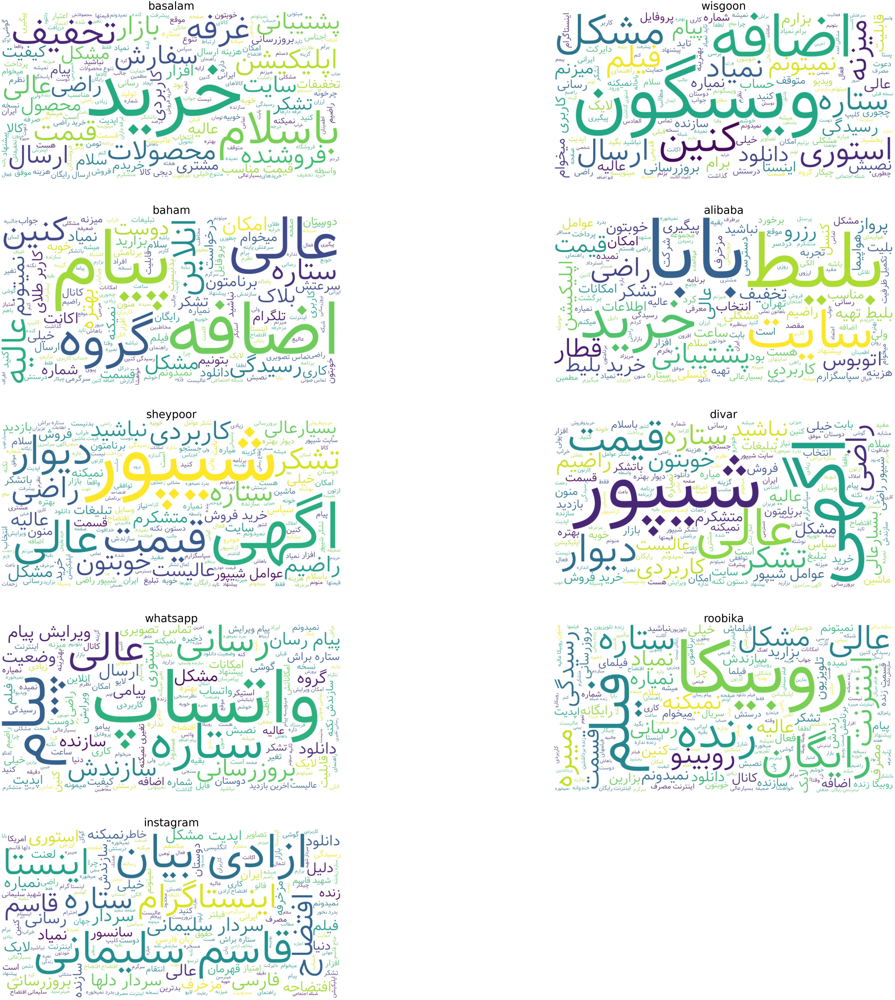

In [230]:
wordCloudPloter(appWordCloud)

# Predicting user rate using comment
Select comment as feature and rate as target to predict array

In [129]:
predict=cleanReviews[['rate','comment']]
predict.shape

(84792, 2)

## Analyze star distribution

In [232]:
rateCount=[]  #count number of comments for each rate 1,2,...,5
sample=pd.DataFrame()
for rate in range(1,6):
  rateComment = predict[predict['rate']==rate]
  sample = pd.concat([sample,rateComment[0:4750]])
  rateCount.append(len(rateComment)/len(predict))

In [233]:
len(sample)

23187

Pie chart for rates distribution

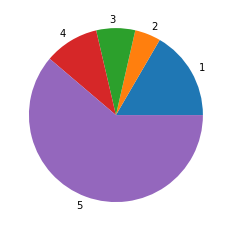

In [71]:
plt.pie(rateCount, labels = [1,2,3,4,5])
plt.show() 

## Prediction
I want to predict the star using user text comment. I use MultinomialNB and 

In [178]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import nltk
import string
from nltk.stem import WordNetLemmatizer

split model to train(75%) and test(25%)

In [189]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(sample['comment'], sample['rate'], test_size=0.25, random_state=42)

In [190]:
#Count vectorizer for bag of words
cv=CountVectorizer(min_df=0,max_df=1,binary=False,ngram_range=(1,3))
#transformed train reviews
cv_train_reviews=cv.fit_transform(X_train)
#transformed test reviews
cv_test_reviews=cv.transform(X_test)

print('BOW_cv_train:',cv_train_reviews.shape)
print('BOW_cv_test:',cv_test_reviews.shape)
#vocab=cv.get_feature_names()-toget feature names

BOW_cv_train: (17390, 88448)
BOW_cv_test: (5797, 88448)


In [191]:
#Tfidf vectorizer
tv=TfidfVectorizer(min_df=0,max_df=1,use_idf=True,ngram_range=(1,3))
#transformed train reviews
tv_train_reviews=tv.fit_transform(X_train)
#transformed test reviews
tv_test_reviews=tv.transform(X_test)
print('Tfidf_train:',tv_train_reviews.shape)
print('Tfidf_test:',tv_test_reviews.shape)

Tfidf_train: (17390, 88448)
Tfidf_test: (5797, 88448)


In [192]:
#training the model
mnb=MultinomialNB()
#fitting the svm for bag of words
mnb_bow=mnb.fit(cv_train_reviews, y_train)
print(mnb_bow)
#fitting the svm for tfidf features
mnb_tfidf=mnb.fit(tv_train_reviews,y_train)
print(mnb_tfidf)

MultinomialNB()
MultinomialNB()


In [193]:
#Predicting the model for bag of words
mnb_bow_predict=mnb.predict(cv_test_reviews)
print(mnb_bow_predict)
#Predicting the model for tfidf features
mnb_tfidf_predict=mnb.predict(tv_test_reviews)
print(mnb_tfidf_predict)

[3 3 3 ... 2 3 3]
[3 3 3 ... 2 3 3]


In [194]:
#Classification report for bag of words 
mnb_bow_report = classification_report(y_test, mnb_bow_predict)
print(mnb_bow_report)

# Classification report for tfidf features
mnb_tfidf_report = classification_report(y_test, mnb_tfidf_predict)
print(mnb_tfidf_report)

              precision    recall  f1-score   support

           1       0.38      0.15      0.21      1191
           2       0.54      0.23      0.33      1061
           3       0.22      0.75      0.33      1170
           4       0.26      0.08      0.13      1203
           5       0.55      0.20      0.29      1172

    accuracy                           0.28      5797
   macro avg       0.39      0.28      0.26      5797
weighted avg       0.39      0.28      0.26      5797

              precision    recall  f1-score   support

           1       0.38      0.15      0.21      1191
           2       0.55      0.23      0.32      1061
           3       0.22      0.75      0.34      1170
           4       0.26      0.08      0.13      1203
           5       0.55      0.20      0.29      1172

    accuracy                           0.28      5797
   macro avg       0.39      0.28      0.26      5797
weighted avg       0.39      0.28      0.25      5797



In [195]:
#Predicting the model for bag of words
mnb_bow_predict=mnb.predict(cv_test_reviews)
print(mnb_bow_predict)
#Predicting the model for tfidf features
mnb_tfidf_predict=mnb.predict(tv_test_reviews)
print(mnb_tfidf_predict)

[3 3 3 ... 2 3 3]
[3 3 3 ... 2 3 3]


In [196]:
#Accuracy score for bag of words
mnb_bow_score=accuracy_score(y_test,mnb_bow_predict)
print("mnb_bow_score :",mnb_bow_score)
#Accuracy score for tfidf features
mnb_tfidf_score=accuracy_score(y_test,mnb_tfidf_predict)
print("mnb_tfidf_score :",mnb_tfidf_score)

mnb_bow_score : 0.2810074176298085
mnb_tfidf_score : 0.2808349146110057


In [200]:
from sklearn.ensemble import RandomForestClassifier
 
    # Instantiate Random Forest Classifier
model = RandomForestClassifier(n_estimators=800,
                                   max_depth=4,
                                   min_samples_leaf=0.001,
                                   
                                   n_jobs=-1)
 
    # Fit model to the training set
model.fit(tv_train_reviews, y_train)

RandomForestClassifier(max_depth=4, min_samples_leaf=0.001, n_estimators=800,
                       n_jobs=-1)

In [209]:
# Predict test set labels
y_pred = model.predict(tv_test_reviews)
y_pred_prob = model.predict_proba(tv_test_reviews)
# Evaluate test set accuracy
print('Accuracy score RF(test set for Tf-IDF) = %0.4f'%accuracy_score(y_test, y_pred))

# Predict test set labels
y_pred = model.predict(cv_test_reviews)
y_pred_prob = model.predict_proba(cv_test_reviews)
# Evaluate test set accuracy
print('Accuracy score RF(test set for bow) = %0.4f'%accuracy_score(y_test, y_pred))

Accuracy score RF(test set for Tf-IDF) = 0.2022
Accuracy score RF(test set for bow) = 0.2022
